In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import sys
from ROOT import TH1F, TF1, TCanvas, gROOT, TLine, TLegend
from ROOT import kRed, kGreen, kBlue, kDashed

from scipy import odr
import itertools

In [6]:
# ds_to_fiber = {'17h08': 'fiber 2', '16h59': 'fiber 1', '17h17':'fiber 3'} ##meas1
# ds_to_fiber = {'15h54': 'fiber 2', '14h43': 'fiber 1', '13h17':'fiber 3'} ##meas6
ds_to_fiber = {'12h40': 'fiber 2', '12h29': 'fiber 1', '12h47':'fiber 3'} ##meas5

def fit_baseline(data,draw=False):
    x = data["baseline"].to_numpy()
    y = data["filtered_amplitude"].to_numpy()
    
    m, c = np.polyfit(x, y, 1)

    if(draw):
        x_fit = np.linspace(np.min(x),np.max(x), 1000)
        y_fit = m*x_fit + c
        
        plt.scatter(x, y)
        plt.plot(x_fit,y_fit,color="orange")
        plt.text(np.average(x_fit), np.average(y_fit), f"y = {m:.3f}*x + {c:.3f}")
        plt.ylabel("Baseline")
        plt.xlabel("Filtered Amplitude")
        plt.show()
        
    return m,c 

def get_avg_amplitude(data,draw=False,tag=''):
    ampl = data["filtered_amplitude"].to_numpy()
    
    hist_name = f"ampl_{tag}" if tag else "ampl"
    canvas_name = f"c_{tag}" if tag else "c"
    
    h = TH1F(hist_name,hist_name,100,ampl.min()-5,ampl.max()+5)
    
    for value in ampl:
        h.Fill(value)
    
    h.Fit("gaus","QS")

    gaus = h.GetFunction("gaus")
    mean  = gaus.GetParameter(1)
    sigma = gaus.GetParameter(2)

    
    if(draw):
        gROOT.SetBatch(False)
        c = TCanvas(canvas_name,canvas_name,800,600)
        h.Draw("HIST")
        c.Update()
        return mean, sigma, c, h

    return mean,sigma

def get_baseline_corrected_amplitude(data,draw=False,tag=''):
    m,c = fit_baseline(data,draw)
    
    avg_ampl,_ = get_avg_amplitude(data)
    # avg_ampl = data["fitted_amplitude"].mean()
    
    return  data["filtered_amplitude"] * avg_ampl / (data["baseline"]*m + c)


def ntd1_vs_ntd2_amplitude(datasets,center_ds):
    for ds in datasets:
        data = datasets[ds]
        # print(ds)
        ampl_ntd1 = get_baseline_corrected_amplitude(data["NTD1"])
        ampl_ntd2 = get_baseline_corrected_amplitude(data["NTD2"])
    
        plt.scatter(ampl_ntd1,ampl_ntd2,label=ds_to_fiber[ds],s=.1)

    x = np.linspace(0,10000)
    
    data = datasets[center_ds]
    avg_ntd1 = np.average(get_baseline_corrected_amplitude(data["NTD1"]))
    avg_ntd2 = np.average(get_baseline_corrected_amplitude(data["NTD2"]))
    
    m = avg_ntd2/avg_ntd1
    plt.plot(x,m*x,"--",color="grey",lw=1)
    plt.legend()
    

In [7]:
column_names = ["trigger_position", "raw_amplitude", "filtered_amplitude", 
               "baseline", "baseline_RMS", "correlation", "TV", 
               "tvl", "tvr", "fitted_amplitude", "fitted_baseline", "rise_time", 
               "decay_time", "delayed_amplitude", "mean_time", "area_raw_pulse",
               "area_filtered_pulse", "baseline_ampl", "t10_cf"
              ]
ntps = {}
datasets = {}
ds_keys = []
base_dir = r"\Users\Berkeley\Documents\CERES\enzo_data"
meas_dir = "meas5"
ntp_directory = os.path.join(base_dir,meas_dir)

for file in os.listdir(ntp_directory): 
    if("ntp" in file and not ("info" in file)):
        ntp_name = file.split("_")[1].rstrip(".ntp")
        ds = ntp_name.rstrip(".BINNTD12")
        ntps[file.split("_")[1].rstrip(".ntp")]  = pd.read_csv(os.path.join(ntp_directory,file),sep=r"\s+",names=column_names)
        if(not ds in ds_keys): ds_keys.append(ds)
for ds in ds_keys:
    datasets[ds] = pd.concat([ntps[ds + ".BINNTD1"],ntps[ds + ".BINNTD2"]], axis=1, join="inner", keys=["NTD1","NTD2"])

In [10]:
# Define the path to your specific .ntp file
file_path = r"\Users\Berkeley\Documents\CERES\enzo_data\meas4\20260126_11h32.BINNTD1.ntp"

# Read the file using pandas
df = pd.read_csv(file_path, sep=r"\s+", names=column_names)

# Make combos
pairs_to_plot = list(itertools.permutations(column_names, 2))

# 1. Calculate the Pearson correlation matrix for your specific columns
corr_matrix = df[column_names].corr(method='pearson')

# 2. Unstack the matrix into a list of pairs so it's easier to filter
corr_pairs = corr_matrix.unstack()

# 3. Set a threshold for what you consider "linear". 
# Usually, > 0.7 or < -0.7 is considered a strong linear relationship.
threshold = 0.75

# Filter out the self-correlations (which equal exactly 1.0) and weak correlations
strong_linear_pairs = corr_pairs[(abs(corr_pairs) >= threshold) & (corr_pairs != 1.0)]

# Drop duplicates (since A->B and B->A will have the same score)
strong_linear_pairs = strong_linear_pairs.drop_duplicates()

# Sort them so the strongest relations are at the top
print(strong_linear_pairs.sort_values(ascending=False))

filtered_amplitude  fitted_amplitude       0.999994
fitted_amplitude    area_filtered_pulse    0.999642
filtered_amplitude  area_filtered_pulse    0.999596
raw_amplitude       filtered_amplitude     0.999085
                    fitted_amplitude       0.999028
                    area_filtered_pulse    0.998384
filtered_amplitude  area_raw_pulse         0.998218
fitted_amplitude    area_raw_pulse         0.998206
area_raw_pulse      area_filtered_pulse    0.998016
raw_amplitude       area_raw_pulse         0.997953
delayed_amplitude   area_raw_pulse         0.995900
raw_amplitude       delayed_amplitude      0.990014
delayed_amplitude   area_filtered_pulse    0.989288
filtered_amplitude  delayed_amplitude      0.989120
fitted_amplitude    delayed_amplitude      0.989107
trigger_position    baseline               0.983399
TV                  tvl                    0.969753
                    tvr                    0.942258
tvl                 tvr                    0.832015
baseline    

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your dataframe is named 'df' and 'column_names' is defined
# 1. Calculate the correlation matrix
corr_matrix = df[column_names].corr()

# 2. Set up the matplotlib figure (14x12 inches gives it plenty of room)
plt.figure(figsize=(14, 12))

# 3. Draw the heatmap
sns.heatmap(
    corr_matrix, 
    vmin=-1, vmax=1, center=0,   # Locks the color scale from -1 to 1
    cmap='coolwarm',             # Blue for negative, red for positive correlation
    annot=True,                  # Overlays the actual correlation numbers
    fmt=".2f",                   # Formats the numbers to 2 decimal places
    annot_kws={"size": 8},       # Shrinks the font size slightly to fit the boxes
    square=True,                 # Forces the boxes to be perfectly square
    linewidths=.5                # Adds a small border between boxes for clarity
)

# 4. Add a title, adjust layout, and display
plt.title('Correlation Heatmap of Pulse Variables', fontsize=16)
plt.tight_layout()
plt.show()

ModuleNotFoundError: No module named 'seaborn'

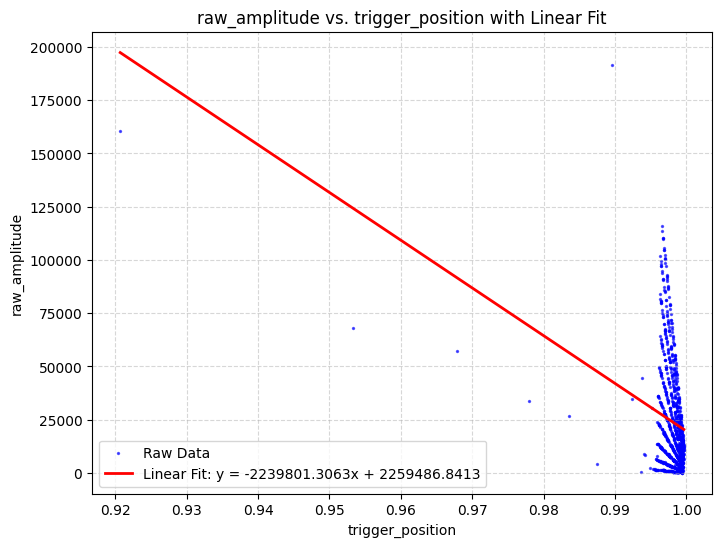

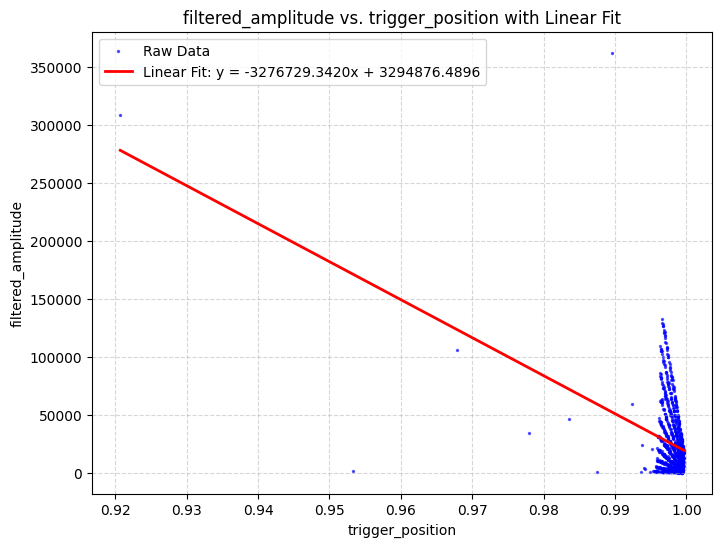

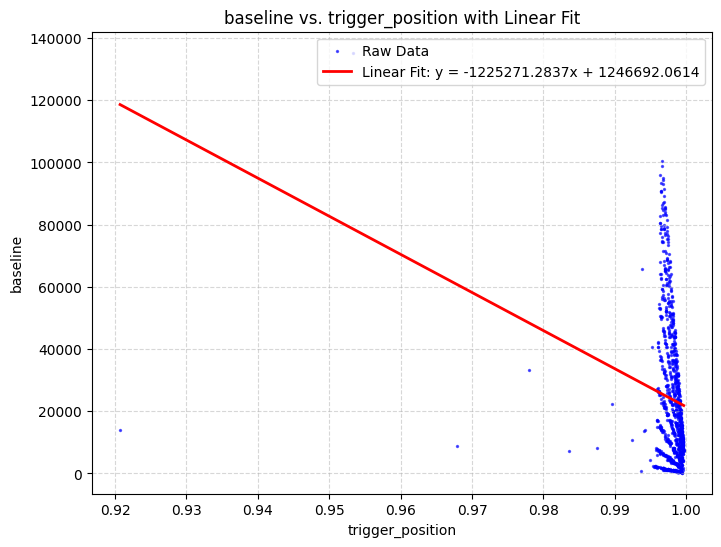

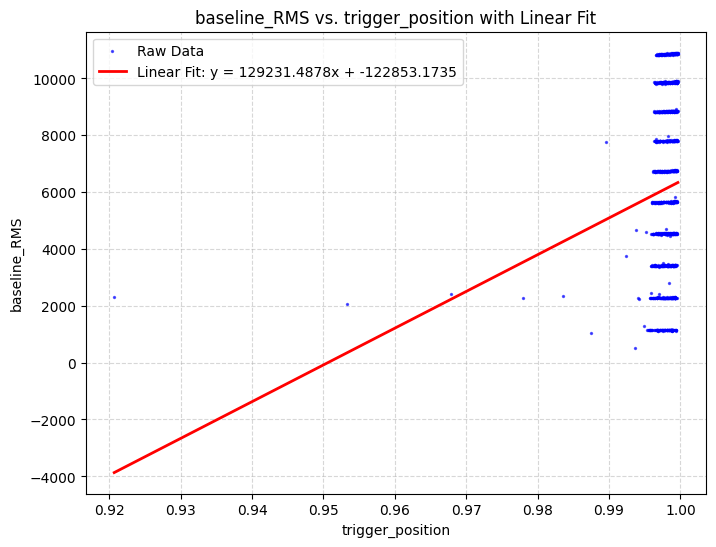

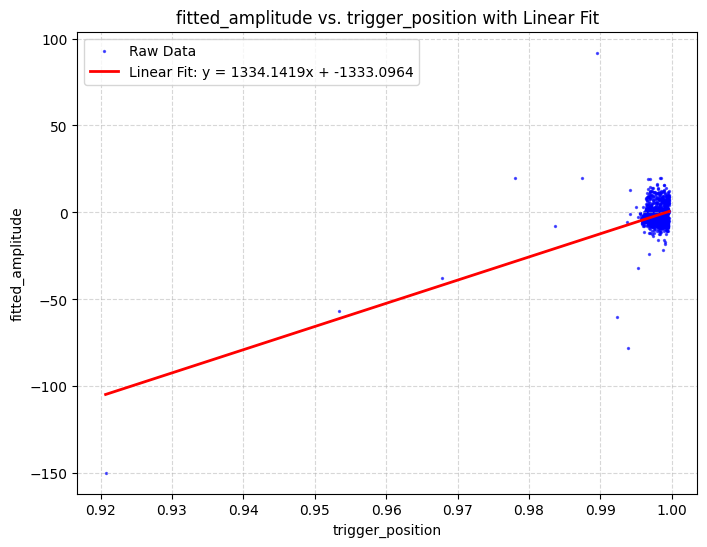

...

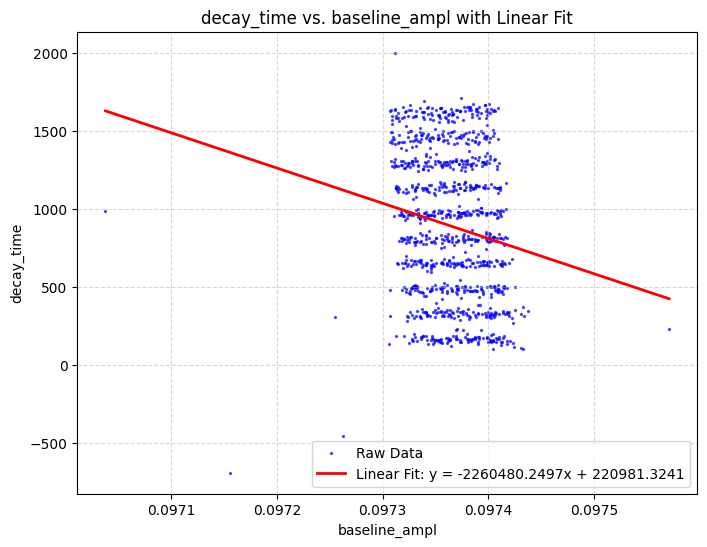

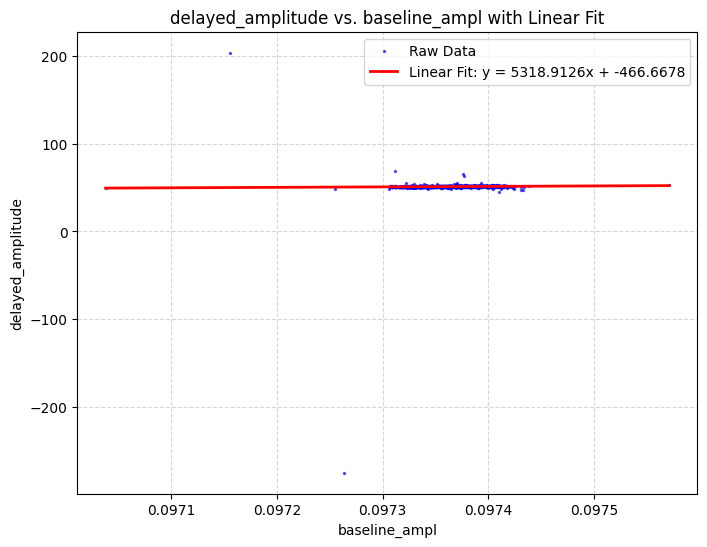

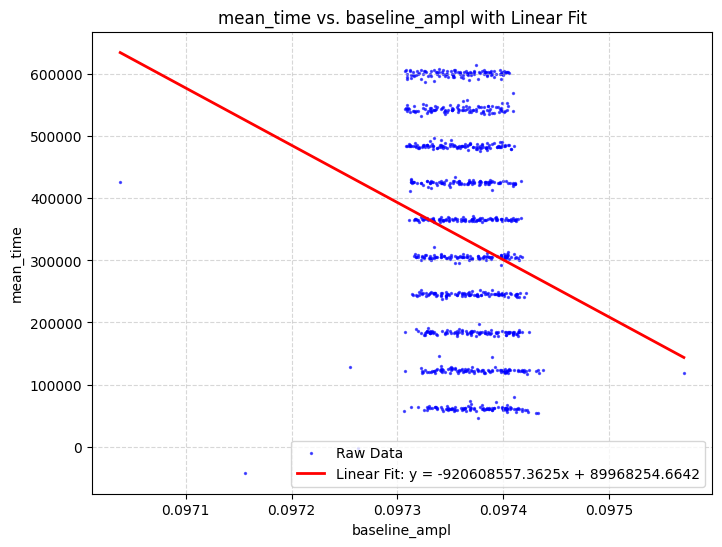

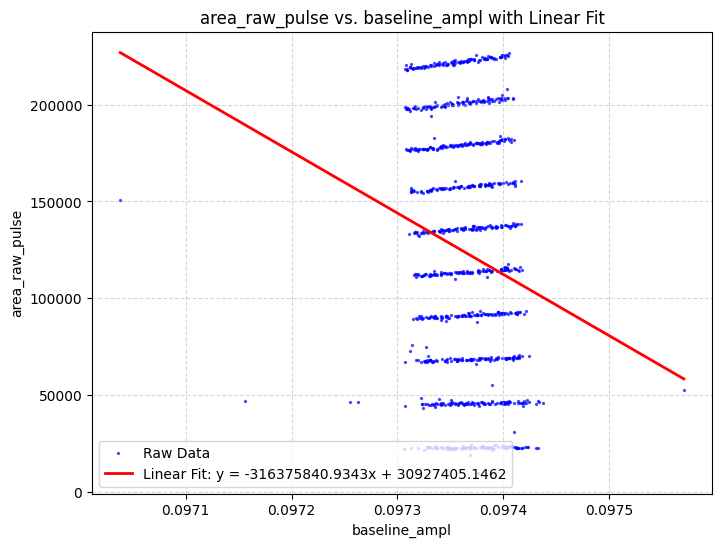

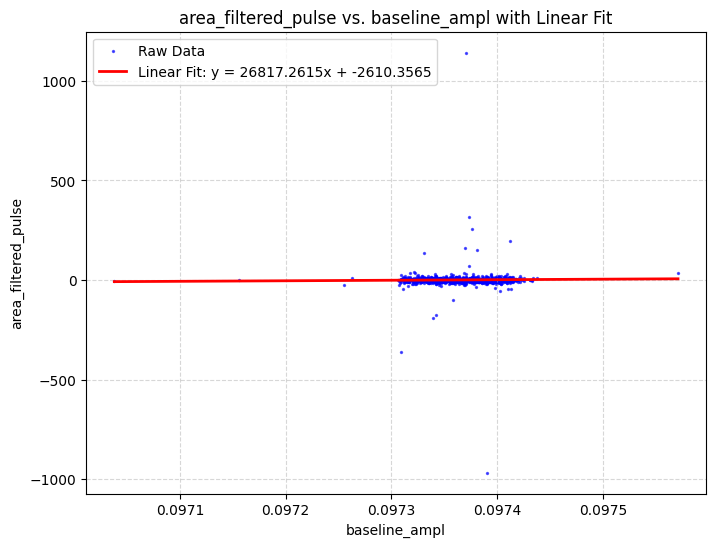

baseline_RMS        area_raw_pulse        0.999642
                    mean_time             0.998206
mean_time           area_raw_pulse        0.998016
decay_time          mean_time             0.995900
                    area_raw_pulse        0.989288
baseline_RMS        decay_time            0.989107
raw_amplitude       filtered_amplitude    0.969753
                    baseline              0.942258
filtered_amplitude  baseline              0.832015
dtype: float64


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools

# Define the path to your specific .ntp file
file_path = r"\Users\Berkeley\Documents\CERES\enzo_data\meas4\20260126_11h32.BINNTD1.ntp"

# The column names from original documentation, minus the plots we don't care about for this
column_names = [
    "trigger_position", "raw_amplitude", "filtered_amplitude", 
    "baseline", "baseline_RMS", "fitted_amplitude", "fitted_baseline", "rise_time", 
    "decay_time", "delayed_amplitude", "mean_time", "area_raw_pulse",
    "area_filtered_pulse", "baseline_ampl"
]

# Read the file using pandas
df = pd.read_csv(file_path, sep=r"\s+", names=column_names)

# Make combos
pairs_to_plot = list(itertools.permutations(column_names, 2))

# Loop through each pair and generate a plot
for x_col, y_col in pairs_to_plot:
    # Extract data for the current pair
    x_data = df[x_col]
    y_data = df[y_col]
    
    # Perform linear fit (degree 1 polynomial)
    m, c = np.polyfit(x_data, y_data, 1)
    
    # Create coordinates for the line of best fit
    x_fit = np.linspace(x_data.min(), x_data.max(), 100)
    y_fit = m * x_fit + c
    
    # Generate the plot
    plt.figure(figsize=(8, 6))
    
    # Scatter plot of raw data
    plt.scatter(x_data, y_data, alpha=0.6, s=2, color="blue", label="Raw Data")
    
    # Plot the linear fit line
    plt.plot(x_fit, y_fit, color="red", linewidth=2, label=f"Linear Fit: y = {m:.4f}x + {c:.4f}")
    
    # Format the plot
    plt.title(f"{y_col} vs. {x_col} with Linear Fit")
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    
    # Display the plot
    plt.show()

# 1. Calculate the Pearson correlation matrix for your specific columns
corr_matrix = df[column_names].corr(method='pearson')

# 2. Unstack the matrix into a list of pairs so it's easier to filter
corr_pairs = corr_matrix.unstack()

# 3. Set a threshold for what you consider "linear". 
# Usually, > 0.7 or < -0.7 is considered a strong linear relationship.
threshold = 0.75

# Filter out the self-correlations (which equal exactly 1.0) and weak correlations
strong_linear_pairs = corr_pairs[(abs(corr_pairs) >= threshold) & (corr_pairs != 1.0)]

# Drop duplicates (since A->B and B->A will have the same score)
strong_linear_pairs = strong_linear_pairs.drop_duplicates()

# Sort them so the strongest relations are at the top
print(strong_linear_pairs.sort_values(ascending=False))

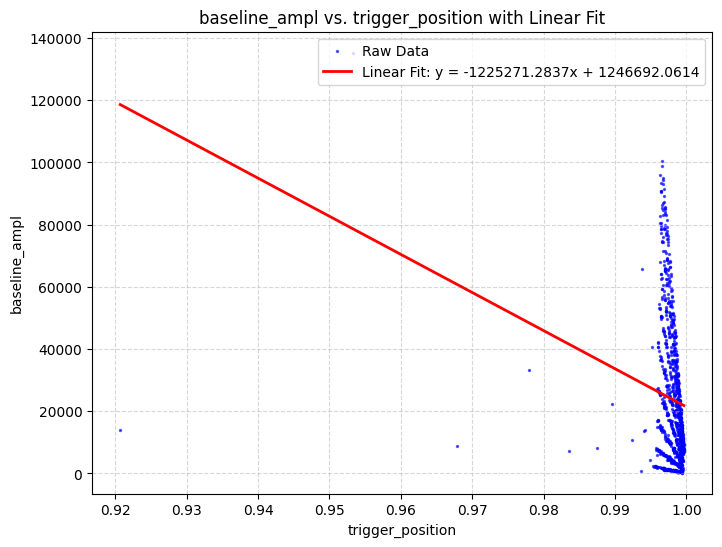

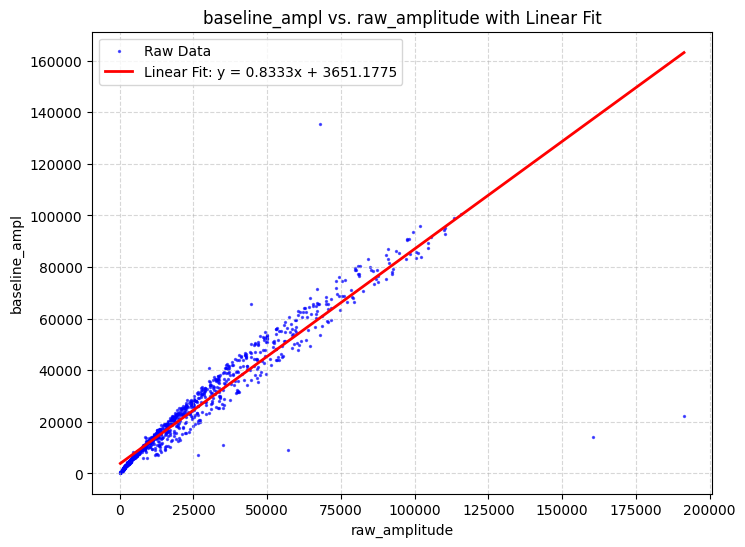

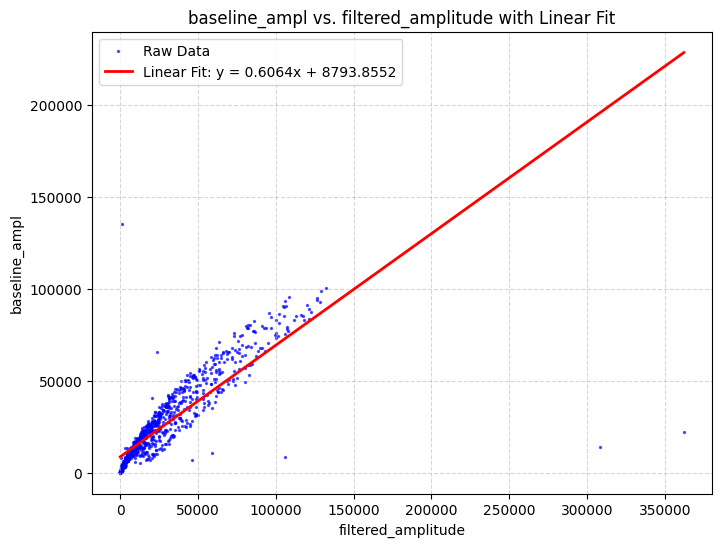

KeyError: 'correlation'

In [ ]:
# Define the path to your specific .ntp file
file_path = r"\Users\Berkeley\Documents\CERES\enzo_data\meas4\20260126_11h32.BINNTD1.ntp"

# Read the file using pandas (handling space-separated values)
df = pd.read_csv(file_path, sep=r"\s+", names=column_names)

to_plot = ["trigger_position", "raw_amplitude", "filtered_amplitude", 
               "correlation", "TV", 
               "tvl", "tvr", "fitted_amplitude", "rise_time", 
               "decay_time", "delayed_amplitude", "mean_time", "area_raw_pulse",
               "area_filtered_pulse", "t10_cf"
              ]

# Loop through each pair and generate a plot
for x_col in to_plot:
    # Extract data for the current pair
    x_data = df[x_col]
    y_data = df["baseline"]
    
    # Perform linear fit (degree 1 polynomial)
    m, c = np.polyfit(x_data, y_data, 1)
    
    # Create coordinates for the line of best fit
    x_fit = np.linspace(x_data.min(), x_data.max(), 100)
    y_fit = m * x_fit + c   
    
    # Generate the plot
    plt.figure(figsize=(8, 6))
    
    # Scatter plot of raw data
    plt.scatter(x_data, y_data, alpha=0.6, s=2, color="blue", label="Raw Data")
    
    # Plot the linear fit line
    plt.plot(x_fit, y_fit, color="red", linewidth=2, label=f"Linear Fit: y = {m:.4f}x + {c:.4f}")
    
    # Format the plot
    plt.title(f"{y_col} vs. {x_col} with Linear Fit")
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    
    # Display the plot
    plt.show()

In [ ]:
datasets.keys()

dict_keys(['12h29', '12h40', '12h47'])

(2000.0, 6500.0)

Info in <TCanvas::MakeDefCanvas>:  created default TCanvas with name c1


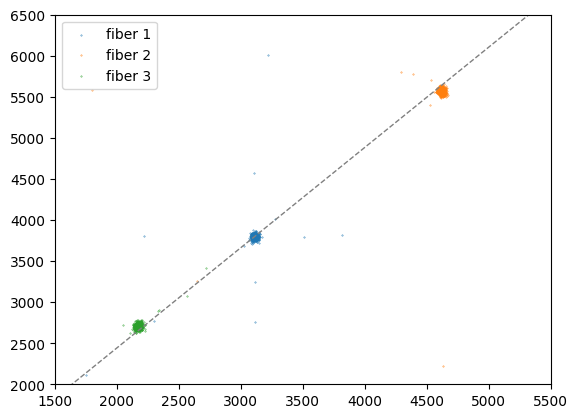

In [ ]:
ntd1_vs_ntd2_amplitude(datasets,'12h29')
plt.xlim(1500,5500)
plt.ylim(2000,6500)

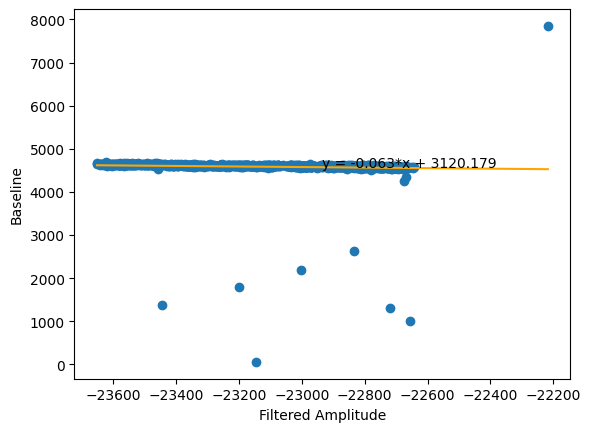

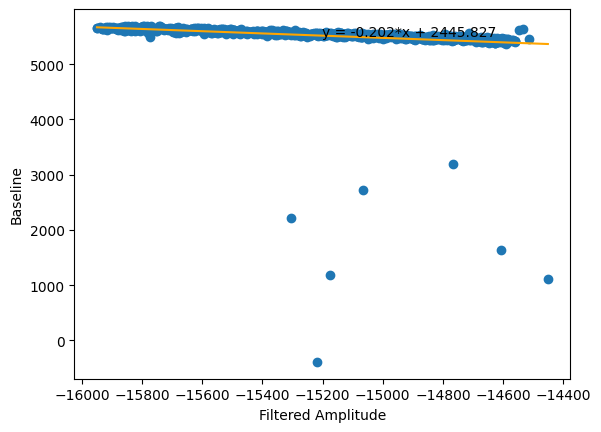

In [ ]:
test1 = get_baseline_corrected_amplitude(datasets['12h40']['NTD1'],True)
test2 = get_baseline_corrected_amplitude(datasets['12h40']['NTD2'],True)

In [ ]:
c = TCanvas()
gROOT.SetBatch(False)
# color = {'17h08': kRed, '16h59': kBlue, '17h17':kGreen} ##meas1
color = {'12h29':kBlue, '12h40':kRed, '12h47':kGreen} ##meas5

hists = []
fits = []
lines = []
ymax = 0
first_hist = TH1F()
legend = TLegend()
for i,ds in enumerate(datasets):
    t1 = datasets[ds]['NTD1']["t10_cf"]
    t2 = datasets[ds]['NTD2']["t10_cf"]
    delta_t = t1-t2
    # ampl = datasets[ds]['NTD1']["rise_time"]
    x_binOffset = 1e-4
    x_min = 3.2e-3#delta_t.min() - x_binOffset
    x_max = 4.6e-3#delta_t.max() + x_binOffset
    
    h = TH1F(ds,ds,100,x_min,x_max)
    
    
    
    for value in delta_t:
        h.Fill(value)
    h.Scale( 1/h.Integral())
        
    fit = TF1(f"gaus_{ds}", "gaus", x_min, x_max)
    fit.SetLineColor(color[ds])
    fits.append(fit)
    
    h.Fit(fit,"0")
    h.SetStats(False)
    h.SetLineColor(color[ds])
    
    hists.append(h)

    if(i == 0): 
        first_hist = h
        h.Draw("HIST")
    else: h.Draw("HIST SAME")

    fit.Draw("L SAME")

    peak_x = fit.GetParameter(1)                 # mean of Gaussian
    peak_y = fit.Eval(peak_x)                    # height at the mean (== fit.GetParameter(0))
    if peak_y > ymax : 
        ymax = peak_y
        first_hist.SetMaximum(ymax +.02)
    vline = TLine(peak_x, 0.0, peak_x, peak_y)
    vline.SetLineColor(color[ds])
    vline.SetLineStyle(kDashed)
    vline.SetLineWidth(2)
    vline.Draw("SAME")
    lines.append(vline)   # keep reference
    legend.AddEntry(fit,f"{ds_to_fiber[ds]}: {peak_x*1000:.5f} ms","l")

legend.Draw()
first_hist.SetTitle(";#Deltat(NTD1-NTD2);Events [a.u.]")
    

****************************************
Minimizer is Minuit2 / Migrad
Chi2                      =      66.4796
NDf                       =           41
Edm                       =  9.35532e-06
NCalls                    =           63
Constant                  =    0.0609823   +/-   0.00254466  
Mean                      =   0.00395007   +/-   3.11389e-06 
Sigma                     =  8.59296e-05   +/-   2.29614e-06  	 (limited)
****************************************
Minimizer is Minuit2 / Migrad
Chi2                      =      47.2704
NDf                       =           35
Edm                       =  8.95116e-10
NCalls                    =           71
Constant                  =    0.0696237   +/-   0.00284666  
Mean                      =    0.0039332   +/-   2.75578e-06 
Sigma                     =  7.68098e-05   +/-   1.98557e-06  	 (limited)
****************************************
Minimizer is Minuit2 / Migrad
Chi2                      =      50.3312
NDf                   